## Explore all Tile Options for Segmentation

There are many different options that can be utilized for creating the segmentation dataset for our models, here we explore a set of ideas and settle on automatic segmentation using infrared aerial photographs

In [76]:
import os
import rasterio
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import skimage
import re

from pathlib import Path
from PIL import Image
from rasterio.windows import Window
from rasterio.transform import from_gcps
from rasterio.mask import mask
from rasterio.control import GroundControlPoint as GCP
from shapely.geometry import box, Polygon
from skimage import feature
from skimage import exposure

In [4]:
sns.set_style('darkgrid')

In [107]:
root = 'C:/Users/mikelaucella/Downloads'
usgs = 'C:/Users/mikelaucella/Downloads/USGS'

root_0339 = 'E:/USGS/TX/6214000300339.tif'
root_0087 = 'E:/USGS/TX/6145001500087.tif'
root_0088 = 'E:/USGS/TX/6145001500088.tif'
root_0089 = 'E:/USGS/TX/6145001500089.tif'
root_0010 = 'E:/USGS/TX/6106000400010.tif'

## Explore the USGS Tile Indexes

Lets take a look at the USGS tiles to see the extent of aerial data we have available for pretraining and how it relates to downstream tasks

In [17]:
def clean_tilename(tilename: str) -> str:
    filename = os.path.splitext(tilename)[0]
    tilename = filename.split('_')[1]
    return tilename

def load_state_shape(root: str, state: str) -> gpd.GeoDataFrame:
    tile_index = 'TILE_INDEX.shp/tile_index.shp'
    if state == 'ND' or state == 'SD':
        tile_index = 'TILE_INDEX.shp/dakota_tile_index.shp'
    if state == 'NM':
        tile_index = 'TILE_INDEX.shp/mexico_tile_index.shp'

    df = gpd.read_file(os.path.join(root, state, tile_index))
    df['state_short'] = state

    if 'state' not in df.columns:
        df['state'] = state

    if state == 'TX':
        df['id'] = df['new_id']
    if state == 'MT':
        df['id'] = df['tileName'].apply(clean_tilename)

    return df

In [18]:
states = {
    state: load_state_shape(usgs, state)
    for state in os.listdir(usgs)
    if os.path.isdir(os.path.join(usgs, state))
}

In [116]:
tile_indexes = pd.concat(states.values(), ignore_index=True)

In [649]:
state_full = [ # The 17 state names in the USGS western region
    'Texas', 'Montana', 'North Dakota', 'South Dakota', 'New Mexico',
    'Oklahoma', 'Kansas', 'Nebraska', 'Wyoming', 'Colorado', 'Utah',
    'Idaho', 'Washington', 'Oregon', 'California', 'Nevada', 'Arizona'
]

st_boundaries = gpd.read_file(os.path.join(root, 'ne_10m_admin_1_states_provinces/ne_10m_admin_1_states_provinces.shp'))
st_boundaries = st_boundaries[st_boundaries.name.isin(state_full)]
st_boundaries = st_boundaries[st_boundaries['iso_3166_2'] != 'BG-12']

In [72]:
cities = gpd.read_file(os.path.join(root, '500Cities_City_11082016/CityBoundaries.shp'))
cities = cities[cities['ST'].isin(states.keys())]
cities = cities.to_crs(tile_indexes.crs)

In [659]:
ca_tiles = ['R07C04', 'R07C05', 'R07C06', 'R08C05', 'R08C06', 'R09C06'] # Tiles near lyme disease hotspots in CA
tx_tiles = ['R06C18', 'R06C19', 'R07C18', 'R07C19', 'R08C18', 'R08C19'] # Tiles near lyme disease hotspots in TX
points = pd.concat([
    states['CA'][states['CA'].id.isin(ca_tiles)],
    states['TX'][states['TX'].id.isin(tx_tiles)]
])

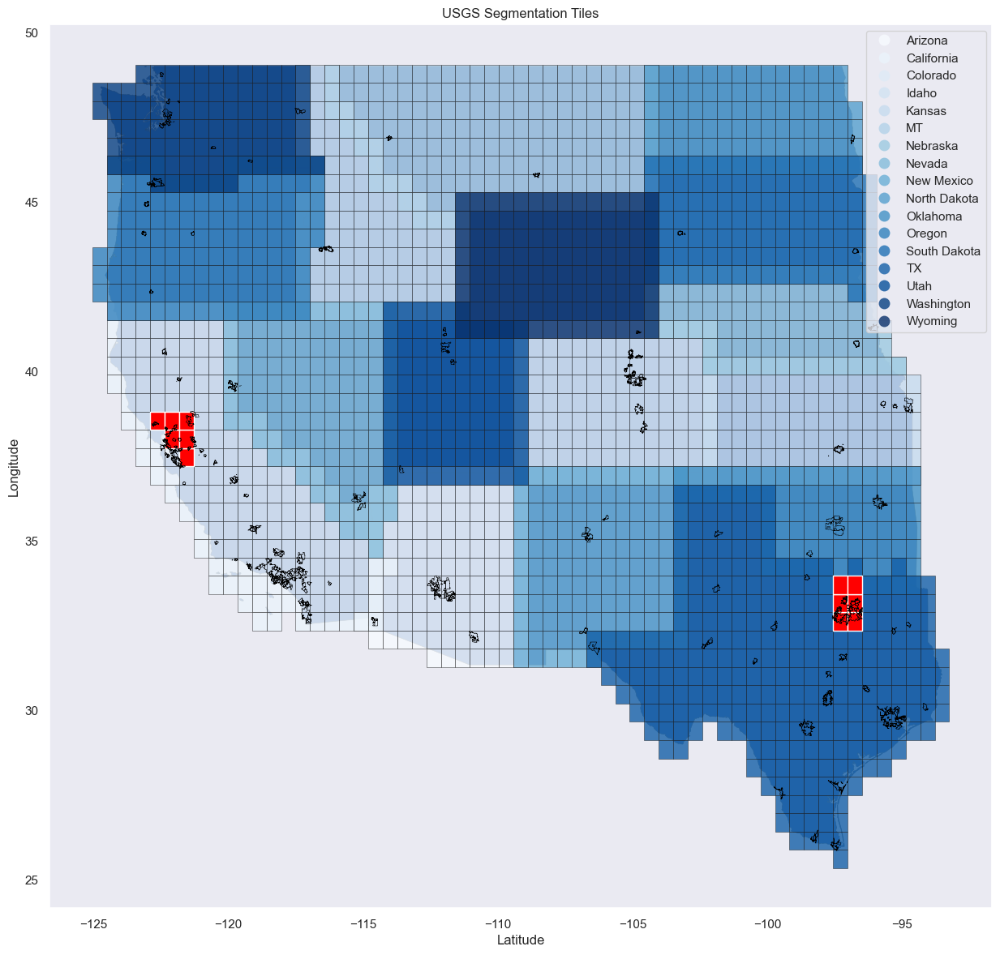

In [660]:
fig, ax = plt.subplots(figsize=(15, 15))
st_boundaries.plot(ax=ax, linewidth=0.4, edgecolor=".4")
tile_indexes.plot(column='state', cmap='Blues', ax=ax, linewidth=0.4, edgecolor=".1", alpha=0.8, legend=True)
points.plot(ax=ax, color='red', markersize=10)
cities.boundary.plot(ax=ax, linewidth=0.4, edgecolor="0")
ax.set_title('USGS Segmentation Tiles')
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
plt.show()

## Explore JPG sized Tile Extraction

If we use the original black and white dataset instead of manually labeling 224x224 patches it would make more sense to take standard JPEG size chunks out of the raster tiles label them and then rechunk them into small 224x224 patches.

In [504]:
def read_windows(tif, height: int, width: int):
    tif_height = math.ceil(tif.height / height)
    tif_width = math.ceil(tif.width / width)

    for i in range(tif_height):
        row_off = i * height
        adj_height = height if i < tif_height - 1 else tif.height % height

        for j in range(tif_width):
            col_off = j * width
            adj_width = width if j < tif_width - 1 else tif.width % width

            block = (i, j)
            window = Window(
                col_off=col_off,
                row_off=row_off,
                width=adj_width,
                height=adj_height
            )

            yield block, window

def get_windows(tif, height: int, width: int):
    blocks = []
    windows = []

    for block, window in read_windows(tif, 224 * 5, 224 * 5):
        blocks.append(block)
        windows.append(window)

    return blocks, windows

def get_coords(tif, windows):
    return [tif.window_bounds(window) for window in windows]

def open_tile(tile_ids, index):
    path = os.path.join(root, tile_ids[index], tile_ids[index] + '.tif')
    return rasterio.open(path)

In [505]:
with open_tile(tile_ids, 0) as tif:
    blocks, windows = get_windows(tif, 224 * 5, 224 * 5)
    coords = get_coords(tif, windows)

    block = blocks[1421]
    window = windows[1421]
    jpg = tif.read(1, window=window)

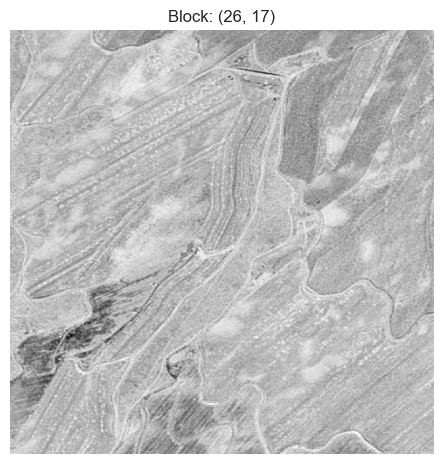

In [563]:
sns.set_style('dark')

plt.imshow(jpg, cmap='gray')
plt.title(f'Block: {block}')
plt.axis('off')
plt.tight_layout()
plt.show()

This would be very difficult to label by eye

## Experiment with Manual Masking

Performing the segmentation by eye would be too cumbersome is the contrast in the images indicative of the vegetation? In the small samples that were checked there is an overlap which was confirmed against modern color imagery. However, this leaves too many unknowns and risks to be left alone in an automated setting.

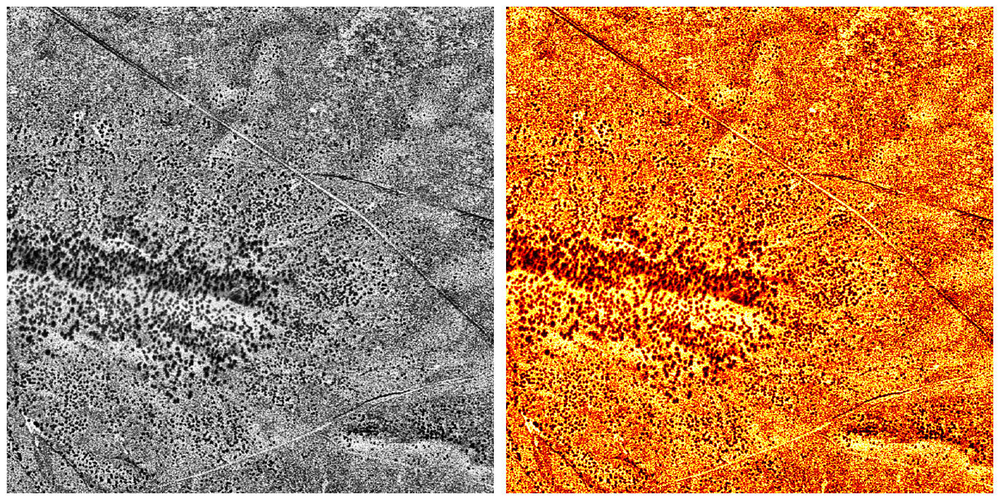

In [314]:
fig, axs = plt.subplots(1, 2, figsize=(15, 15))
axs = axs.flatten()

jpg_eqhist = exposure.equalize_adapthist(jpg, clip_limit=0.03)

axs[0].imshow(jpg_eqhist, cmap='gray')
axs[0].axis('off')

axs[1].imshow(jpg_eqhist, cmap='hot')
axs[1].axis('off')

plt.tight_layout()
plt.show()

The contrast exposes the lighter areas which tend to be dirt or roads when compared against modern imagery

In [434]:
mask = jpg_eqhist < 0.9

In [438]:
jpg_rgb = skimage.color.gray2rgb(jpg)
jpg_rgb[~mask, :] = 0
jpg_rgb[~mask, 0] = 255

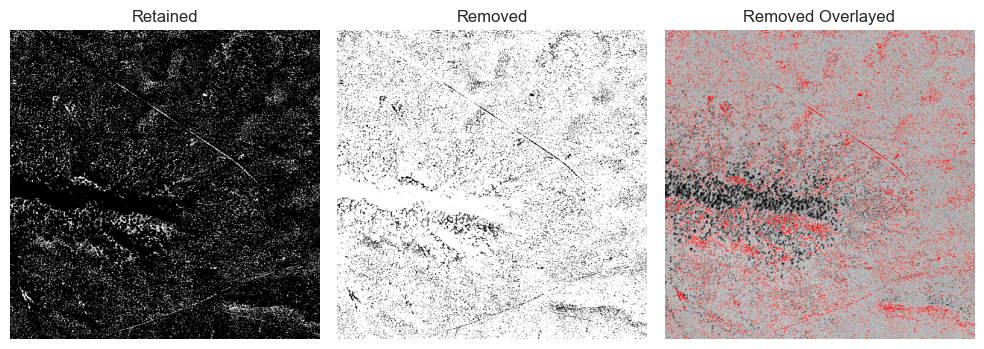

In [665]:
fig, axs = plt.subplots(1, 3, figsize=(10, 15))
axs = axs.flatten()

jpg_eqhist = exposure.equalize_adapthist(jpg, clip_limit=0.03)

axs[0].imshow(~mask, cmap='gray')
axs[0].axis('off')
axs[0].set_title('Retained')

axs[1].imshow(mask, cmap='gray')
axs[1].axis('off')
axs[1].set_title('Removed')

axs[2].imshow(jpg_rgb)
axs[2].axis('off')
axs[2].set_title('Removed Overlayed')

plt.tight_layout()
plt.show()

This is a pretty good approximation when compared with modern color imagery, but it requires a threshold on the mask which may not be suitable in all cases and makes automation risky

## Exploring CIR Imagery

We can use color infrared photos (CIR) instead of guessing where the greenspace is since these images have a similar scale/altitude as the our original black and white photographs. This works by creating a mask on the infrared aspects of these images as segmentation labels, taking the original images and converting them to grayscale and then having the model learn vegetation patterns on black and white imagery. Once complete we can run our original set of grayscale images against the model to predict the greenspace.

In [4]:
with rasterio.open(f'{root_0339}/6214000300339.tif') as tif:
    bbox = box(tif.bounds.left, tif.bounds.bottom, tif.bounds.right, tif.bounds.top)
    cir = tif.read().transpose(1, 2, 0)

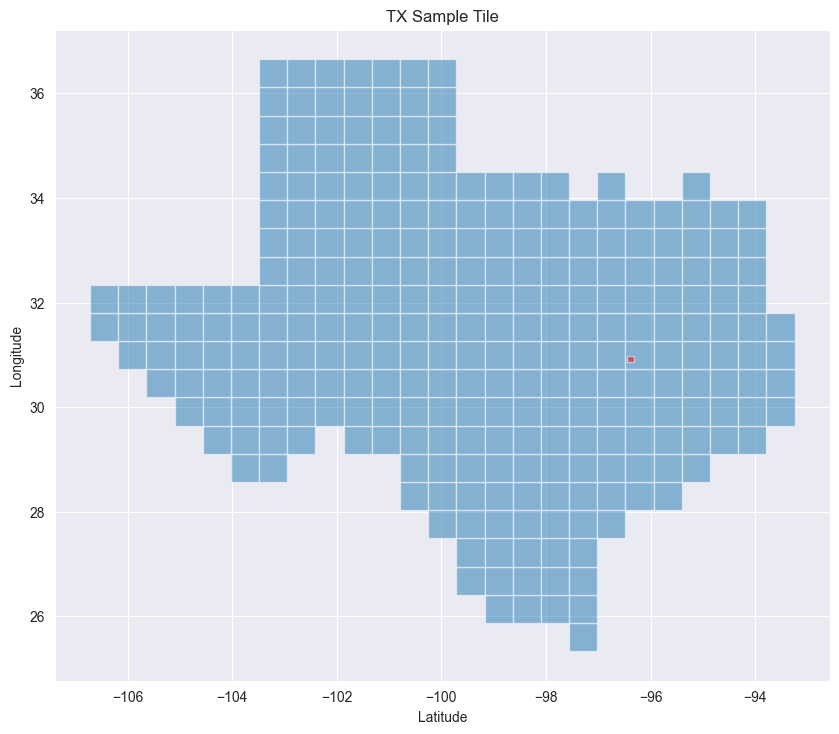

In [28]:
sns.set_style('darkgrid')

fig, ax = plt.subplots(figsize=(10, 10))
states['TX'].plot(ax=ax, markersize=10, alpha=0.5)
gpd.GeoSeries(bbox).plot(ax=ax, color='red', alpha=0.5)
ax.set_title('TX Sample Tile')
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
plt.show()


We can see our sample image and its relation to Texas

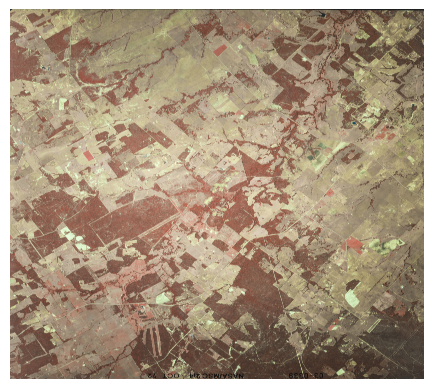

In [ ]:
sns.set_style('dark')

plt.imshow(cir)
plt.axis('off')
plt.show()

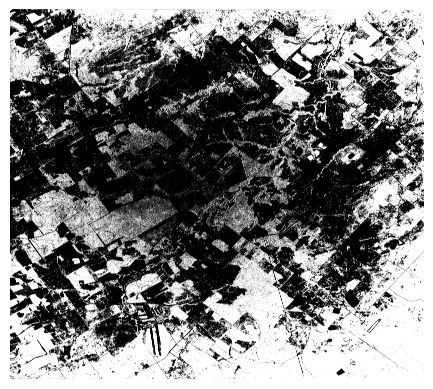

In [11]:
mask = cir[:, :, 0] < 158
plt.imshow(mask, cmap='gray')
plt.axis('off')
plt.show()

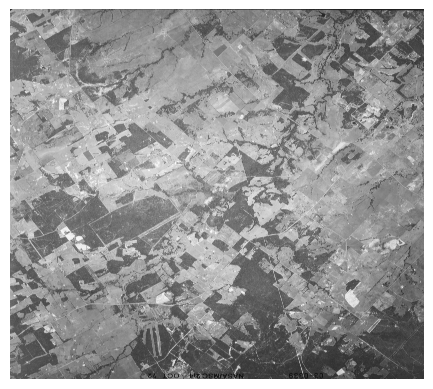

In [13]:
plt.imshow(skimage.color.rgb2gray(cir), cmap='gray')
plt.axis('off')
plt.show()

## Select CIR Images Near Dallas

The selection of data through Earth Explorer is a manual process and it is not possible to retain all the positions of selected images as you browse through the catalog. So in this step we view the overlapping photos and select a subset as to not introduce duplicate information into the models.

In [79]:
def get_box(df, img):
    row = df[df['Photo ID'] == img][['Box']]
    row = row.iloc[0]
    return row['Box']

def get_box_dec(df, img):
    row = df[df['Photo ID'] == img][['BoxDec']]
    row = row.iloc[0]
    return row['BoxDec']

def get_sample_ids(state: str) -> list[str]:
    return {
        os.path.splitext(os.path.splitext(file)[0])[0]
        for file in os.listdir(f'E:/USGS/{state}')
    }

def clean_coord(coord: str) -> str:
    if coord.endswith('W'):
        coord = '-' + coord
    return re.sub(r'[°\'\"NWSE]', ' ', coord).strip()

def get_coords(row) -> list:
    c_lat = clean_coord(row['Center Latitude'])
    c_lon = clean_coord(row['Center Longitude'])
    nw_lat = clean_coord(row['NW Corner Lat'])
    nw_lon = clean_coord(row['NW Corner Long'])
    ne_lat = clean_coord(row['NE Corner lat'])
    ne_lon = clean_coord(row['NE Corner Long'])
    se_lat = clean_coord(row['SE Corner Lat'])
    se_lon = clean_coord(row['SE Corner Long'])
    sw_lat = clean_coord(row['SW Corner Lat'])
    sw_lon = clean_coord(row['SW Corner Long'])

    return [
        (nw_lon, nw_lat),
        (sw_lon, sw_lat),
        (se_lon, se_lat),
        (ne_lon, ne_lat),
        (c_lon, c_lat)
    ]

def get_coords_dec(row) -> list:
    c_lat = row['Center Latitude dec']
    c_lon = row['Center Longitude dec']
    nw_lat = row['NW Corner Lat dec']
    nw_lon = row['NW Corner Long dec']
    ne_lat = row['NE Corner Lat dec']
    ne_lon = row['NE Corner Long dec']
    se_lat = row['SE Corner Lat dec']
    se_lon = row['SE Corner Long dec']
    sw_lat = row['SW Corner Lat dec']
    sw_lon = row['SW Corner Long dec']

    return [
        (nw_lon, nw_lat),
        (sw_lon, sw_lat),
        (se_lon, se_lat),
        (ne_lon, ne_lat),
        (c_lon, c_lat)
    ]

def build_geo_df(meta_df):
    coords = meta_df[[
        'NW Corner Lat dec', 'NW Corner Long dec',
        'NE Corner Lat dec', 'NE Corner Long dec',
        'SW Corner Lat dec', 'SW Corner Long dec',
        'SE Corner Lat dec', 'SE Corner Long dec'
    ]].values

    polys = [
        Polygon([
            (coords[i, 1], coords[i, 0]),
            (coords[i, 5], coords[i, 4]),
            (coords[i, 7], coords[i, 6]),
            (coords[i, 3], coords[i, 2]),
            (coords[i, 1], coords[i, 0])
        ])
        for i in range(coords.shape[0])
    ]

    return gpd.GeoDataFrame(sampled_df, geometry=polys)

In [65]:
path = os.path.join(root, 'aerial_combin_67afc89fcfe16f11/aerial_combin_67afc89fcfe16f11.csv')
df = pd.read_csv(path, encoding="latin-1")
df.head()

,Entity ID,Agency,Vendor ID,Recording Technique,Project,Event,Roll,Frame,Acquisition Date,Scale,...,NW Corner Lat dec,NW Corner Long dec,NE Corner Lat dec,NE Corner Long dec,SE Corner Lat dec,SE Corner Long dec,SW Corner Lat dec,SW Corner Long dec,Display ID,Entity ID
0,AR6106000200006,6,NaN,2,10600,NaN,2,6,1969/09/29,65193,...,34.099444,-97.323889,34.187336,-97.203612,34.089958,-97.102223,33.999167,-97.222500,AR6106000200006,AR6106000200006
1,AR6106000400010,6,NaN,2,10600,NaN,4,10,1969/10/01,63927,...,33.198385,-96.715001,33.196389,-96.571944,33.075833,-96.573333,33.077768,-96.716390,AR6106000400010,AR6106000400010
2,AR6106000400011,6,NaN,2,10600,NaN,4,11,1969/10/01,63927,...,33.200182,-96.843779,33.198185,-96.700666,33.077575,-96.702055,33.079511,-96.845168,AR6106000400011,AR6106000400011
3,AR6106000400012,6,NaN,2,10600,NaN,4,12,1969/10/01,63927,...,33.201980,-96.972612,33.199982,-96.829444,33.079317,-96.830833,33.081254,-96.974001,AR6106000400012,AR6106000400012
4,AR6106000400013,6,NaN,2,10600,NaN,4,13,1969/10/01,63927,...,33.203778,-97.101501,33.201780,-96.958277,33.081060,-96.959666,33.082998,-97.102890,AR6106000400013,AR6106000400013


In [68]:
photo_ids = get_sample_ids('TX')

In [69]:
sampled_df = df[df['Photo ID'].isin(photo_ids)].reset_index()
sampled_df.shape

(127, 44)

This is the meta data for each image, this is returned at the search level so we need to overlay it with the sample of images we selected to get only the relevant meta data.

In [368]:
strip_out = {
    'AR6145001500040', 'AR6145001500041', 'AR6145001500043', 'AR6145001500044',
    'AR6145001500046', 'AR6145001500047', 'AR6145001500048', 'AR6145001500049', 
    'AR6145001500051', 'AR6145001500052', 'AR6145001500066', 'AR6145001500067', 
    'AR6145001500069', 'AR6145001500070', 'AR6145001500071', 'AR6145001500072', 
    'AR6145001500074', 'AR6145001500075', 'AR6145001500079', 'AR6145001500080',
    'AR6189000300004', 'AR6191004000366', 'AR6214000300333', 'AR6214000300336', 
    'AR6106000400036', 'AR6106000400097', 'AR6106000400098', 'AR6214000300339',
    'AR6145001500045', 'AR6145001500050', 'AR6145001500068', 'AR6145001500073',
    'AR6189000300000',
}

This set of photo ids to remove was manually curated

In [80]:
photo_df = build_geo_df(sampled_df)

photo_slim_df = photo_df[~photo_df['Display ID'].isin(strip_out)].reset_index()

photo_slim_df['Box'] = photo_slim_df[[
    'NW Corner Lat', 'NW Corner Long',
    'NE Corner lat', 'NE Corner Long',
    'SW Corner Lat', 'SW Corner Long',
    'SE Corner Lat', 'SE Corner Long',
    'Center Latitude', 'Center Longitude'
]].apply(get_coords, axis=1)

photo_slim_df['BoxDec'] = photo_slim_df[[
    'NW Corner Lat dec', 'NW Corner Long dec',
    'NE Corner Lat dec', 'NE Corner Long dec',
    'SW Corner Lat dec', 'SW Corner Long dec',
    'SE Corner Lat dec', 'SE Corner Long dec',
    'Center Latitude dec', 'Center Longitude dec'
]].apply(get_coords_dec, axis=1)

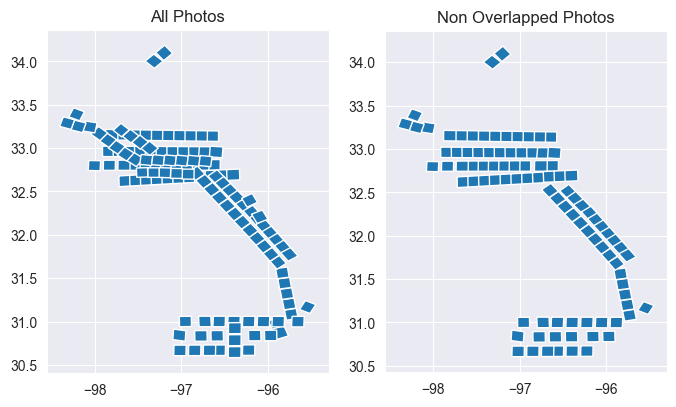

In [183]:
fig, axs = plt.subplots(1, 2, figsize=(8, 8))
axs = axs.flatten()

ax = axs[0]
photo_df.plot(ax=ax)
ax.set_title('All Photos')

ax = axs[1]
photo_slim_df.plot(ax=ax)
ax.set_title('Non Overlapped Photos')

plt.show()

This is a cleaner less overlapped sample of photos

In [ ]:
for photo_id in photo_slim_df['Photo ID'].unique():
    path = Path(os.path.join(f'E:/USGS/{photo_id}.tif.gz'))
    path.rename(os.path.join(f'E:/USGS/TX/{photo_id}.tif.gz'))

## CIR Data near San Fran

In [382]:
path = os.path.join(root, 'aerial_combin_67b101eab5c880af/aerial_combin_67b101eab5c880af.csv')
df = pd.read_csv(path, encoding="latin-1")
df.head()

,Entity ID,Agency,Vendor ID,Recording Technique,Project,Event,Roll,Frame,Acquisition Date,Scale,...,NW Corner Lat dec,NW Corner Long dec,NE Corner Lat dec,NE Corner Long dec,SE Corner Lat dec,SE Corner Long dec,SW Corner Lat dec,SW Corner Long dec,Display ID,Entity ID
0,AR61000003A0003,6,NaN,2,10000,NaN,00003A,3,1969/07/17,63763,...,36.711944,-121.95528,36.776990,-121.82528,36.672602,-121.74528,36.607222,-121.87528,AR61000003A0003,AR61000003A0003
1,AR61000003A0004,6,NaN,2,10000,NaN,00003A,4,1969/07/17,63763,...,36.771353,-121.83654,36.836306,-121.70673,36.732223,-121.62673,36.666936,-121.75654,AR61000003A0004,AR61000003A0004
2,AR61000003A0005,6,NaN,2,10000,NaN,00003A,5,1969/07/17,63763,...,36.830670,-121.71799,36.895530,-121.58836,36.791751,-121.50836,36.726558,-121.63799,AR61000003A0005,AR61000003A0005
3,AR61000003A0006,6,NaN,2,10000,NaN,00003A,6,1969/07/17,63763,...,36.889894,-121.59963,36.954661,-121.47018,36.851186,-121.39018,36.786086,-121.51963,AR61000003A0006,AR61000003A0006
4,AR61000003A0007,6,NaN,2,10000,NaN,00003A,7,1969/07/17,63763,...,36.949025,-121.48145,37.013699,-121.35219,36.910528,-121.27219,36.845521,-121.40145,AR61000003A0007,AR61000003A0007


In [383]:
photo_ids = get_sample_ids('CA')

In [387]:
sampled_df = df[df['Photo ID'].isin(photo_ids)].reset_index()
sampled_df.shape

(172, 44)

In [1089]:
strip_out = {
    '5950050000154', '5950049224757', 'L820560020297', 'L830280892307', 'L830280892358',
    'L830280892312', 'L830280892297', 'L830280892384', 'L830280892317', 'L830280892386',
    'L830280780202', 'L830280892221', 'L830280780185', 'L830280882193', 'L830280882148',
    'L830280790357', 'L830280892244', 'L830280790352', 'L830280892261', 'L830280780200', 
    'L830280882208',
}

In [1090]:
photo_df = build_geo_df(sampled_df)

photo_slim_df = photo_df[~photo_df['Photo ID'].isin(strip_out)].reset_index()

photo_slim_df['Box'] = photo_slim_df[[
    'NW Corner Lat', 'NW Corner Long',
    'NE Corner lat', 'NE Corner Long',
    'SW Corner Lat', 'SW Corner Long',
    'SE Corner Lat', 'SE Corner Long',
    'Center Latitude', 'Center Longitude'
]].apply(get_coords, axis=1)

photo_slim_df['BoxDec'] = photo_slim_df[[
    'NW Corner Lat dec', 'NW Corner Long dec',
    'NE Corner Lat dec', 'NE Corner Long dec',
    'SW Corner Lat dec', 'SW Corner Long dec',
    'SE Corner Lat dec', 'SE Corner Long dec',
    'Center Latitude dec', 'Center Longitude dec'
]].apply(get_coords_dec, axis=1)

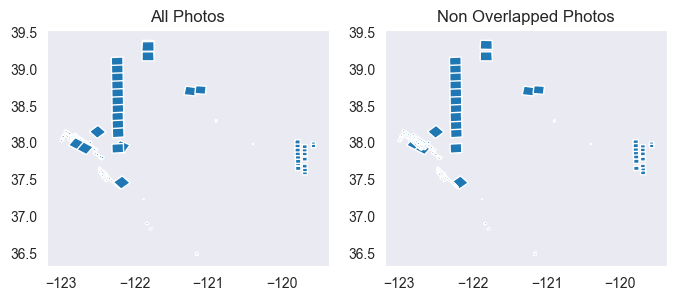

In [1100]:
fig, axs = plt.subplots(1, 2, figsize=(8, 8))
axs = axs.flatten()

ax = axs[0]
photo_df.plot(ax=ax)
ax.set_title('All Photos')

ax = axs[1]
photo_slim_df.plot(ax=ax)
ax.set_title('Non Overlapped Photos')

plt.show()

In [1102]:
for photo_id in photo_slim_df['Photo ID'].unique():
    path = Path(os.path.join(f'E:/USGS/{photo_id}.tif.gz'))
    path.rename(os.path.join(f'E:/USGS/CA/{photo_id}.tif.gz'))

## Linear Projection

The linear projection seems promising at first since it will not rotate the image but as a result it will change the geolocation to match this creating an inaccurate georeferencing of the images

<Axes: >

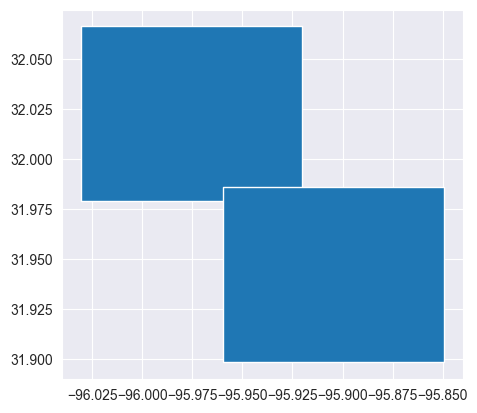

In [ ]:
tif1 = rasterio.open(f'{root_0087}/6145001500087_cleaned.tif')
tif2 = rasterio.open(f'{root_0088}/6145001500088_cleaned.tif')

with tif1, tif2:
    bounds1, bounds2 = tif1.bounds, tif2.bounds

    gpd.GeoDataFrame(geometry=[
        box(bounds1.left, bounds1.bottom, bounds1.right, bounds1.top),
        box(bounds2.left, bounds2.bottom, bounds2.right, bounds2.top)
    ]).plot()

These should be diagonally aligned

## Projection Experimentation

Projecting the actual coordinates fixes the georeferencing which is good but comes at another cost, the images will rotate to match true north based on the coordinate system. This is not ideal since for use in training or when chunking the images to smaller samples for the model.

In [ ]:
from osgeo import gdal, osr

In [ ]:
bbox = get_box_dec(photo_slim_df, '6145001500088')
bbox

In [320]:
with gdal.Open(f'{root_0088}/6145001500088.tif', gdal.GA_Update) as dataset:
    srs = osr.SpatialReference()
    srs.ImportFromEPSG(4326)

    gcps = [
        gdal.GCP(bbox[0][1], bbox[0][0], 0, 0, 0),
        gdal.GCP(bbox[3][1], bbox[3][0], 0, dataset.RasterXSize, 0),
        gdal.GCP(bbox[2][1], bbox[2][0], 0, dataset.RasterXSize, dataset.RasterYSize),
        gdal.GCP(bbox[1][1], bbox[1][0], 0, 0, dataset.RasterYSize)
    ]

    #dataset.SetSpatialRef(srs)
    dataset.SetGCPs(gcps, srs)

    gdal.Warp(
        f'{root_0088}/6145001500088_test.tif',
        dataset,
        format='GTiff',
        dstSRS='EPSG:4326',
        resampleAlg='Bilinear'
        #resampleAlg=gdal.GRA_Bilinear
    )

0

DEBUG:rasterio._io:Output nodata value read from file: None
DEBUG:rasterio._io:Output nodata value read from file: None
DEBUG:rasterio._io:Output nodata value read from file: None
DEBUG:rasterio._io:Output nodata values: [None, None, None]
DEBUG:rasterio._io:all_valid: True
DEBUG:rasterio._io:mask_flags: ([<MaskFlags.all_valid: 1>], [<MaskFlags.all_valid: 1>], [<MaskFlags.all_valid: 1>])
DEBUG:rasterio._io:Jump straight to _read()
DEBUG:rasterio._io:Window: None
DEBUG:rasterio._io:IO window xoff=0.0 yoff=0.0 width=11556.0 height=13969.0


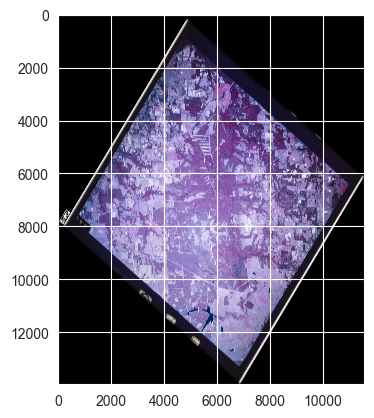

In [323]:
with rasterio.open(f'{root_0088}/6145001500088_test.tif') as tif:
    plt.imshow(tif.read().transpose(1, 2, 0))

## Calculate Projection Matrix

In [110]:
def get_coord_mesh(transform, shape: tuple, chunk_size: int=1) -> tuple:
    row_indices = np.arange(0, shape[0], chunk_size)
    col_indices = np.arange(0, shape[1], chunk_size)
    rows, cols = np.meshgrid(row_indices, col_indices, indexing='ij')
    return transform * (rows, cols)

def get_transform(bbox, shape: tuple):
    ul, ll, lr, ur, _ = bbox
    cols, rows = shape

    gcps = [
        GCP(0, 0, *ul),
        GCP(0, cols, *ur),
        GCP(rows, 0, *ll),
        GCP(rows, cols, *lr)
    ]

    return from_gcps(gcps)

def save_transform(tif, img, transform, out_path: str):
    out_meta = tif.meta.copy()
    out_meta.update({
        "driver": "GTiff",
        "height": img.shape[1],
        "width": img.shape[2],
        "transform": transform,
    })

    with rasterio.open(out_path, "w", **out_meta) as dest:
        dest.write(img)

In [1111]:
tif = rasterio.open(f'{root_0088}/6145001500088.tif')

In [81]:
bbox = get_box_dec(photo_slim_df, '6145001500088')
bbox

[(-96.001914, 31.95426),
 (-95.915672, 31.857964),
 (-95.806266, 31.92352),
 (-95.89205, 32.019816),
 (-95.903866, 31.938855)]

In [105]:
transform = get_transform(bbox, tif.shape)
xs, ys = get_coord_mesh(transform, tif.shape, 1)

Text(0.5, 1.0, 'Coordinates vs. Transform')

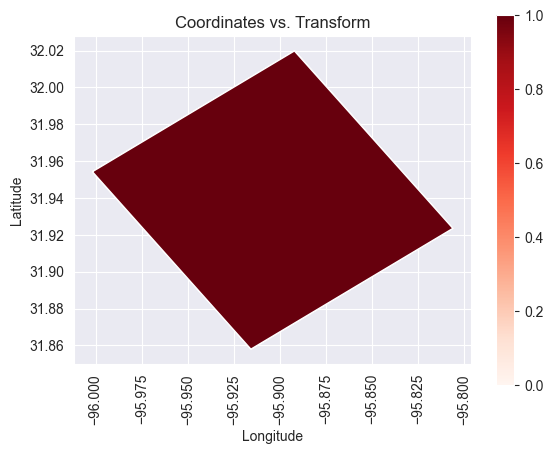

In [106]:
sns.set_style('darkgrid')

gpd.GeoDataFrame(
    { "Id": [0, 1] },
    geometry=[
        Polygon([bbox[0], bbox[1], bbox[2], bbox[3], bbox[0]]),
        Polygon([
            (xs[0, 0], ys[0, 0]),
            (xs[0, -1], ys[0, -1]),
            (xs[-1, -1], ys[-1, -1]),
            (xs[-1, 0], ys[-1, 0]),
            (xs[0, 0], ys[0, 0]),
        ])
    ]
).plot(cmap='Reds', column='Id', legend=True)
plt.xticks(rotation=90)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Coordinates vs. Transform')

We can recreate the coordinates using the transform matrix against the pixel coordinates allowing us to keep the image the same while accurately georeferencing. If this graph contained two distinct squares or a rectangle that would mean the coordinates are not well enough aligned.

## Masking Film Strips

The aerial photos are scanned digitally with their film edges intact, we want to attempt masking those out to have the dataset cleaner from the start

In [362]:
film_mask = Polygon([
    (520, 365),
    (520, 9872 - 570),
    (10124 - 650, 9872 - 570),
    (10124 - 650, 365),
    (520, 365)
])

Mask was created by eye on a sample image and needs to be verified against other images

In [53]:
crop_img, crop_transform = mask(tif, shapes=[film_mask], crop=True)

In [60]:
save_transform(tif, crop_img, crop_transform, f'{root_0088}/6145001500088_crop.tif')
tif.close()

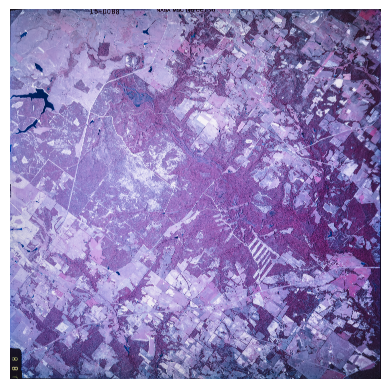

In [ ]:
plt.imshow(crop_img.transpose(1, 2, 0))
plt.axis('off')
plt.show()

Here we are able to use the mask to remove the film, we intentionally leave the other bad elements in the photo since its tied to the georeference, when performing the chunking process we simply offset the windows at the top and left side to account for this.

## Confirming Mask within Roll

Ideally the mask should apply to all the images in the same roll

In [364]:
tif = rasterio.open(f'{root_0089}/6145001500089.tif')

In [365]:
crop_img, crop_transform = mask(tif, shapes=[film_mask], crop=True)
tif.close()

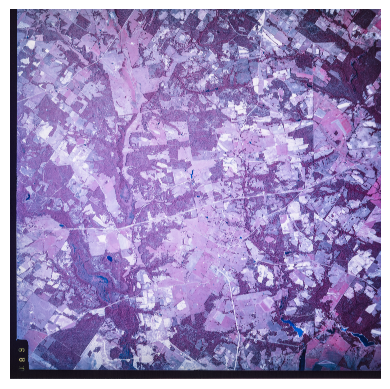

In [366]:
plt.imshow(crop_img.transpose(1, 2, 0))
plt.axis('off')
plt.show()

There is a slight shift even within the same image rolls.

## Confirm Mask across Rolls

Seeing as it differs within the rolls its a safe bet to assume the mask would differ accross rolls

In [111]:
tif = rasterio.open(f'{root_0010}/6106000400010.tif')

In [219]:
film_mask = Polygon([
    (760, 520),
    (760, 9872 - 320),
    (10618 - 800, 9872 - 320),
    (10618 - 800, 520),
    (760, 520)
])

In [220]:
crop_img, crop_transform = mask(tif, shapes=[film_mask], crop=True)

In [221]:
save_transform(tif, crop_img, crop_transform, f'{root_0010}/6106000400010_crop.tif')
tif.close()

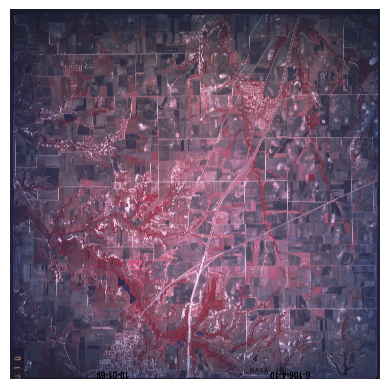

In [202]:
plt.imshow(crop_img.transpose(1, 2, 0))
plt.axis('off')
plt.show()

Clearly its not a one size fits all for the masks on the images, we may need a new mask per roll

**Recommendation:** The clipping has to be done manually it will likely be faster to do this with software than applying asjusting polygon masks

## Explore Chunk Quality of CIR

With CIR data there is high and medium resolution imagery, the original image is taken at a scale so since were chunking by pixels we need to confirm which is the original resolution so that the quality of patches is similar to those in the pretrain set

In [223]:
with rasterio.open(f'{root_0010}/6106000400010_crop.tif') as tif:
    cir = tif.read().transpose(1, 2, 0)

In [226]:
cbw = skimage.color.rgb2gray(cir)

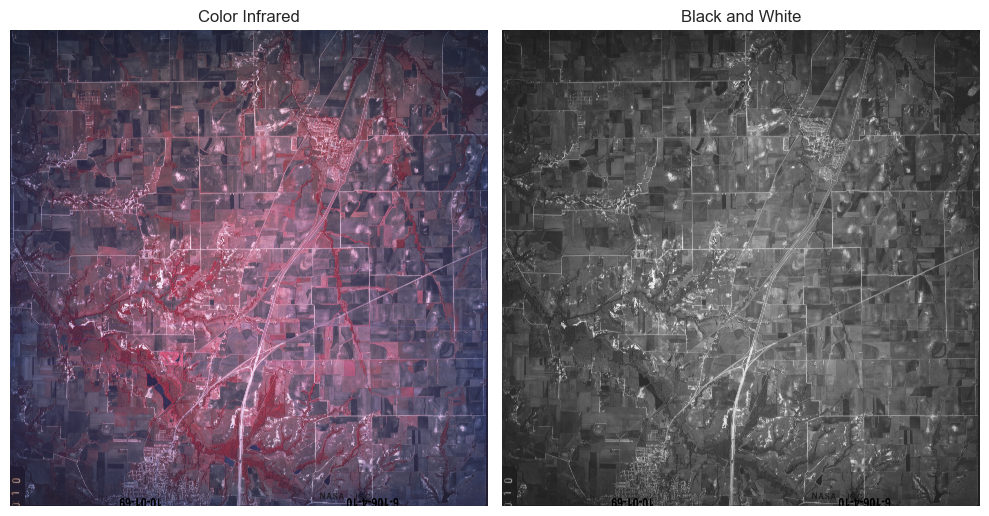

In [228]:
fig, axs = plt.subplots(1, 2, figsize=(10, 10))
axs = axs.flatten()

axs[0].imshow(cir)
axs[0].axis('off')
axs[0].set_title('Color Infrared')

axs[1].imshow(cbw, cmap='gray')
axs[1].axis('off')
axs[1].set_title('Black and White')

plt.tight_layout()
plt.show()

In [357]:
def get_9_windows(chunk_size: 224):
    return [
        (i * chunk_size, j * chunk_size, (i + 1) * chunk_size, (j + 1) * chunk_size)
        for i in range(3)
        for j in range(3)
    ]

def approx_area(poly: Polygon) -> float:
    x, y = poly.exterior.xy
    return abs(np.trapz(y, x))

def manual_approx_area(xs: list, ys: list) -> float:
    x1 = (xs[0, 0] - xs[0, 224]) ** 2
    y1 = (ys[0, 0] - ys[0, 224]) ** 2

    x2 = (xs[0, 224] - xs[224, 224]) ** 2
    y2 = (ys[0, 224] - ys[224, 224]) ** 2

    d1 = np.sqrt(x1 + y1)
    d2 = np.sqrt(x2 + y2)
    return d1 * d2

In [303]:
windows = get_9_windows(224)

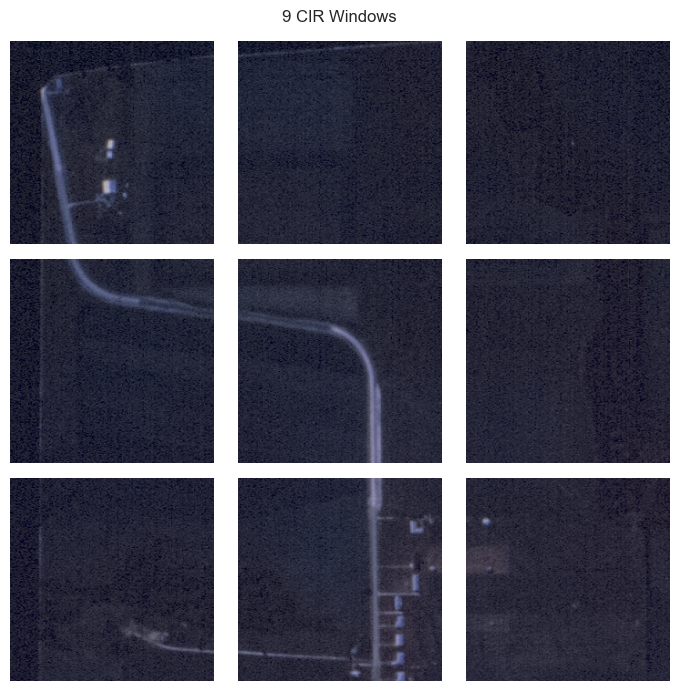

In [304]:
fig, axs = plt.subplots(3, 3, figsize=(7, 7))
axs = axs.flatten()

for i, (row_off, col_off, height, width) in enumerate(windows):
    img = cir[row_off:height, col_off:width, :]
    axs[i].imshow(img)
    axs[i].axis('off')

fig.suptitle('9 CIR Windows')
plt.tight_layout()
plt.show()

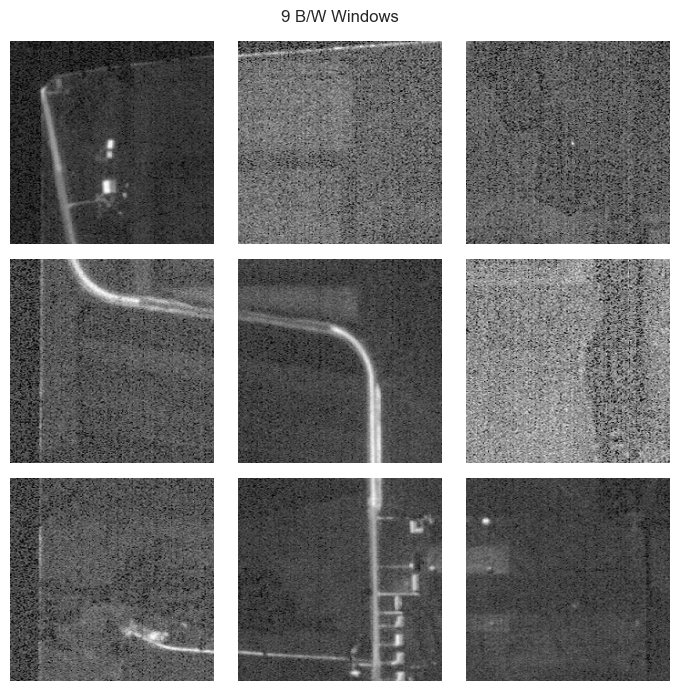

In [305]:
fig, axs = plt.subplots(3, 3, figsize=(7, 7))
axs = axs.flatten()

for i, (row_off, col_off, height, width) in enumerate(windows):
    img = cbw[row_off:height, col_off:width]
    axs[i].imshow(img, cmap='gray')
    axs[i].axis('off')

fig.suptitle('9 B/W Windows')
plt.tight_layout()
plt.show()

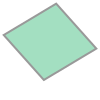

In [306]:
chunk_poly = Polygon([
    (xs[0, 0], ys[0, 0]),
    (xs[0, 224], ys[0, 224]),
    (xs[224, 224], ys[224, 224]),
    (xs[224, 0], ys[224, 0]),
    (xs[0, 0], ys[0, 0]),
])
chunk_poly

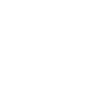

In [307]:
example_poly = Polygon([
    (-115.79759221085929, 32.82544659484553),
    (-115.79759221085929, 32.82774628197288),
    (-115.79989189798664, 32.82774628197288),
    (-115.79989189798664, 32.82544659484553),
    (-115.79759221085929, 32.82544659484553)
])
example_poly

Example taken from pretrain data on a 256x256 chunk with a similar scale of 60000, and altitude of 30000 ft

In [360]:
print("Chunk area: ", chunk_poly.area)
print("Chunk area (approx): ", approx_area(chunk_poly))
print("Verify Chunk area manually: ", manual_approx_area(xs, ys))
print("Example area: ", example_poly.area)
print("Chunk area / Example area: ", chunk_poly.area / example_poly.area)
print("Chunk area - Example area: ", chunk_poly.area - example_poly.area)
print("Chunk area > Example area: ", chunk_poly.area > example_poly.area)

Chunk area:  8.131088196713225e-06
Chunk area (approx):  8.131088196722258e-06
Verify Chunk area manually:  8.280325054564947e-06
Example area:  5.288560883688892e-06
Chunk area / Example area:  1.5374859769112852
Chunk area - Example area:  2.8425273130243333e-06
Chunk area > Example area:  True


Wanted to verify the area calculations to be certain but our patches cover a slightly larger area of 2.8e-6 than our pretraining which seems tolerable